<a href="https://colab.research.google.com/github/abroniewski/Child-Wasting-Prediction/blob/main/notebooks/Acled_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

EDA of Conflict Data

In [ ]:
!pip install geopandas
!pip install pandas-profiling==3.3.0
#!pip install Shapely
#!pip install matplotlib

In [4]:
# General imports
import pandas as pd
from pandas_profiling import ProfileReport

# Plotting imports
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import matplotlib.pyplot as plt # plotting
import numpy as np 
import seaborn as sns
from shapely.geometry import Point
# import geopandas as gpd
# from geopandas import GeoDataFrame
import plotly.express as px

In [5]:
# Confihuration setting
data_dir = "https://raw.githubusercontent.com/abroniewski/Child-Wasting-Prediction/main/data/raw/1900-01-01-2022-09-27-Eastern_Africa-Somalia.csv"

# For pandas
pd.options.display.max_columns = 200 # display upto 200 columns (instead of default 20)
pd.options.display.max_rows = 200 # display upto 200 rows (instead of default 60)

In [6]:
# Read data
conflict_df = pd.read_csv(data_dir)

In [ ]:
# Basic checks
print(conflict_df.shape)


(37782, 31)


In [ ]:
# Dropping the unnecessary columns
df_clean = conflict_df.drop(labels=['data_id','iso','event_id_cnty','event_id_no_cnty','year','time_precision','region','country','geo_precision','timestamp','iso3'],axis=1)
# Converting the event_date to correct format
df_clean['event_date'] = pd.to_datetime(df_clean['event_date'])

,event_date,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,admin1,admin2,admin3,location,latitude,longitude,source,source_scale,notes,fatalities
0,23 September 2022,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0
1,23 September 2022,Battles,Armed clash,Al Shabaab,NaN,2,Military Forces of Somalia (2022-),NaN,1,12,Lower Shabelle,Afgooye,NaN,Almada,2.2187,45.2087,Al Furqaan; Calamada,National,"On 23 September 2022, overnight, Al Shabaab mi...",0


In [ ]:

df_clean.head(2)


,event_date,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,admin1,admin2,admin3,location,latitude,longitude,source,source_scale,notes,fatalities
0,2022-09-23,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0
1,2022-09-23,Battles,Armed clash,Al Shabaab,NaN,2,Military Forces of Somalia (2022-),NaN,1,12,Lower Shabelle,Afgooye,NaN,Almada,2.2187,45.2087,Al Furqaan; Calamada,National,"On 23 September 2022, overnight, Al Shabaab mi...",0


In [ ]:
#For checking the unique values in the dataset
df_clean.nunique()

event_date         6643
event_type            6
sub_event_type       24
actor1              690
assoc_actor_1       330
inter1                8
actor2              574
assoc_actor_2       820
inter2                9
interaction          40
admin1               18
admin2               74
admin3                0
location           1564
latitude           1548
longitude          1533
source             1007
source_scale         23
notes             34975
fatalities           72
dtype: int64

In [ ]:
#Checking for NUll values in the dataset
df_clean.isnull().sum()

event_date            0
event_type            0
sub_event_type        0
actor1                0
assoc_actor_1     35019
inter1                0
actor2             2913
assoc_actor_2     32049
inter2                0
interaction           0
admin1                0
admin2                0
admin3            37782
location              0
latitude              0
longitude             0
source                0
source_scale          0
notes              1725
fatalities            0
dtype: int64

Here we can see that assoc_actor_1, assoc_actor_2 and admin3 have a lot of NULL values where : <br>
assoc_actor_1 = The named actor associated with or identifying actor1 <br>
assoc_actor_2 = The named actor associated with or identifying actor2 <br>
admin3 = The third largest sub-national administrative region in which
the event took place

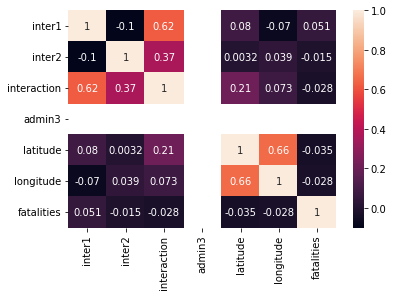

In [ ]:
#Plotting the heatmap for correlation matrix
correlation = df_clean.corr()
sns.heatmap(correlation, xticklabels=correlation.columns, yticklabels=correlation.columns, annot=True)

Here, <br>
INTER1 = A numeric code indicating the type of ACTOR1 i.e. the one causing the event<br>
INTER2 = A numeric code indicating the type of ACTOR2 i.e. the one opposing the event<br>
INTERACTION =  A numeric code indicating the interaction between types of
ACTOR1 and ACTOR2 <br>


ACLED Event Type : Maybe we can focus on the "Violent events" as manily the fatalities occur in here.

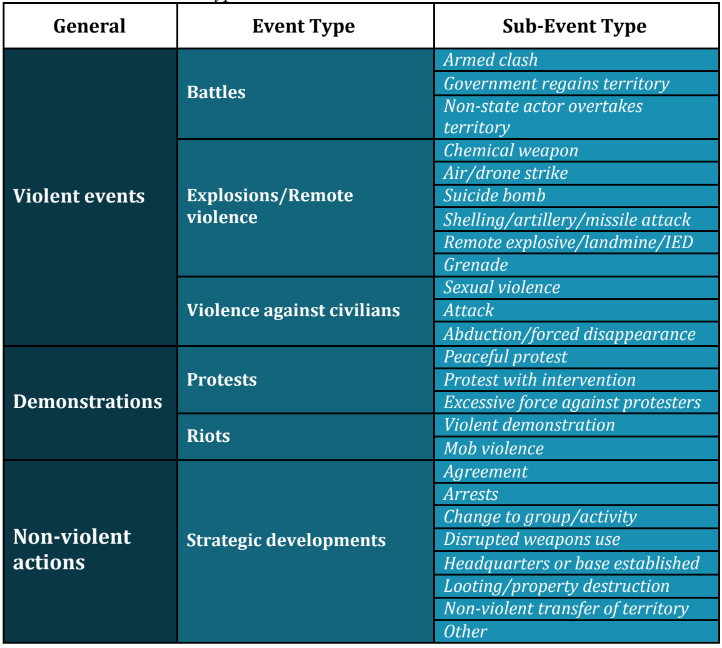

In [ ]:
# Histogram of column data
def plotHistogram(df, nHistogramShown, nHistogramPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nHistRow = (nCol + nHistogramPerRow - 1) / nHistogramPerRow
    plt.figure(num=None, figsize=(6*nHistogramPerRow, 8*nHistRow), dpi=80, facecolor='w', edgecolor='k')
    for i in range(min(nCol, nHistogramShown)):
        plt.subplot(nHistRow, nHistogramPerRow, i+1)
        df.iloc[:,i].hist()
        plt.ylabel('counts')
        plt.xticks(rotation=90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad=1.0, w_pad=1.0, h_pad=1.0)
    plt.show()

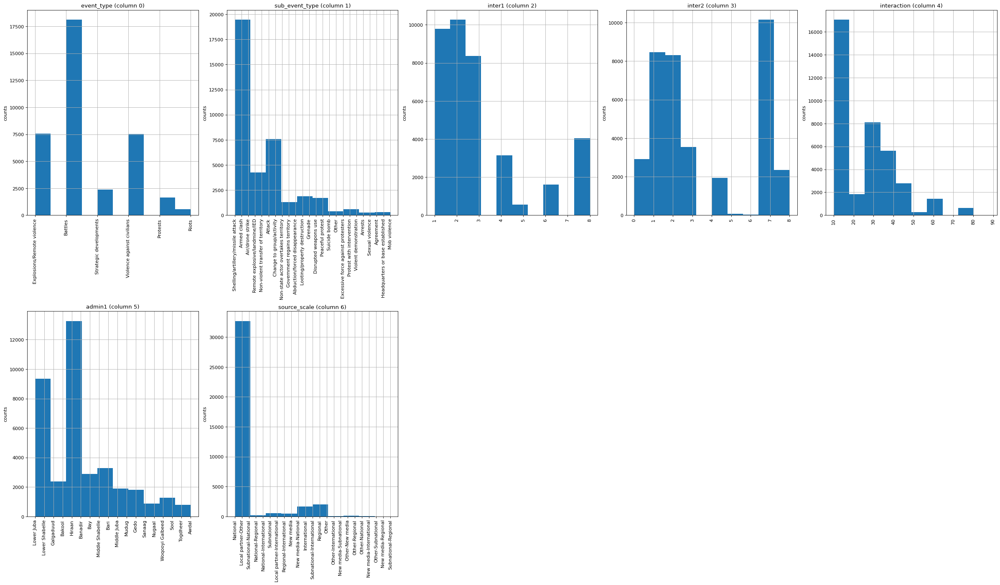

In [ ]:
plotHistogram(df_clean, 10, 5)

In [ ]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  """


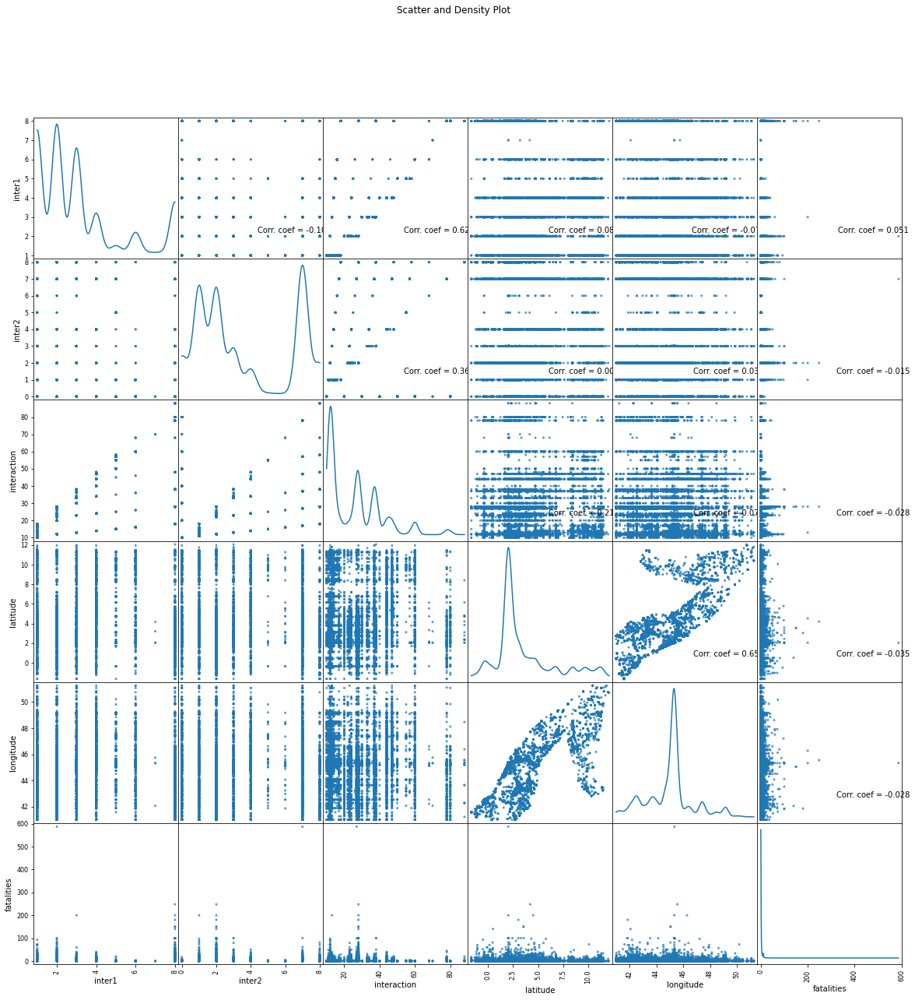

In [ ]:
plotScatterMatrix(df_clean, 20, 10)

In [ ]:
# SELF-EXPLORATION
# NOTE : Maybe this is not required currently I just wanted to visualize the data geographically for the fatalities
# Graph showing the regions with fatalities with hover-around feature
fig = px.scatter_geo(df_clean,lat='latitude',lon='longitude',hover_name='fatalities')
fig.update_layout(title = 'Conflict data of Somalia - 1997-2022', title_x=1)
fig.show()

## Pandas profiling section

In [ ]:
import pandas as pd
from pandas_profiling import ProfileReport

In [ ]:
data_dir = "https://raw.githubusercontent.com/abroniewski/Child-Wasting-Prediction/main/data/raw/1900-01-01-2022-09-27-Eastern_Africa-Somalia.csv"
acled_df = pd.read_csv(data_dir, parse_dates=['event_date'])
acled_df.head(1)

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
0,9499027,706,SOM38074,38074,2022-09-23,2022,1,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Eastern Africa,Somalia,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,1,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0,1664231916,SOM


In [ ]:
acled_profile = ProfileReport(acled_df, title="Acled Data Profiling Report")

acled_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Columns iso, region, country, iso3 are constant. we can drop these columns. \

These columns have a lot of missing values. We can further investigate what to do (drop or fill the values) \
assoc_actor_1 has 35019 (92.7%) missing values \
actor2 has 2913 (7.7%) missing values	\
assoc_actor_2 has 32049 (84.8%) missing values 	
admin3 has 37782 (100.0%) missing values	\
notes has 1725 (4.6%) missing values \

column fatalities is highly skewed (γ1 = 34.35420305). From what I saw this just means that some incidents are outliers with a way bigger number of fatalities. \

Columns fatalities and inter2 have a big number of 0 values. \
inter2 has 2913 (7.7%) zeros	\
fatalities has 21873 (57.9%) zeros \
We need still to check the documentation to see if the zeros mean missing information or actually 0. \

Al shabaab is in fact the actor that most appears in the incidents.

More insights can be drawn by looking at the EDA.


# Visualizing Time Series

Creating time series visualizations with a modification of code provided by Dr. Juan Camilo Orduz in his blog names [Regression Analysis & Visualization](https://juanitorduz.github.io/lm_viz/) published 2020-06-26

Start by preparing the notebook and variables

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# Data Viz. 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style(
    style='darkgrid', 
    rc={'axes.facecolor': '.9', 'grid.color': '.8'}
)
sns.set_palette(palette='deep')
sns_c = sns.color_palette(palette='deep')
%matplotlib inline
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

plt.rcParams['figure.figsize'] = [12, 6]
plt.rcParams['figure.dpi'] = 100

In [ ]:
df_clean.head(1)

,event_date,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,admin1,admin2,admin3,location,latitude,longitude,source,source_scale,notes,fatalities
0,2022-09-23,Explosions/Remote violence,Shelling/artillery/missile attack,Al Shabaab,NaN,2,ATMIS: African Union Transition Mission in Som...,NaN,8,28,Lower Juba,Kismaayo,NaN,Abdale Birole,-0.4906,42.1969,Calamada; Al Furqaan,National,"On 23 September 2022, Al Shabaab militants fir...",0


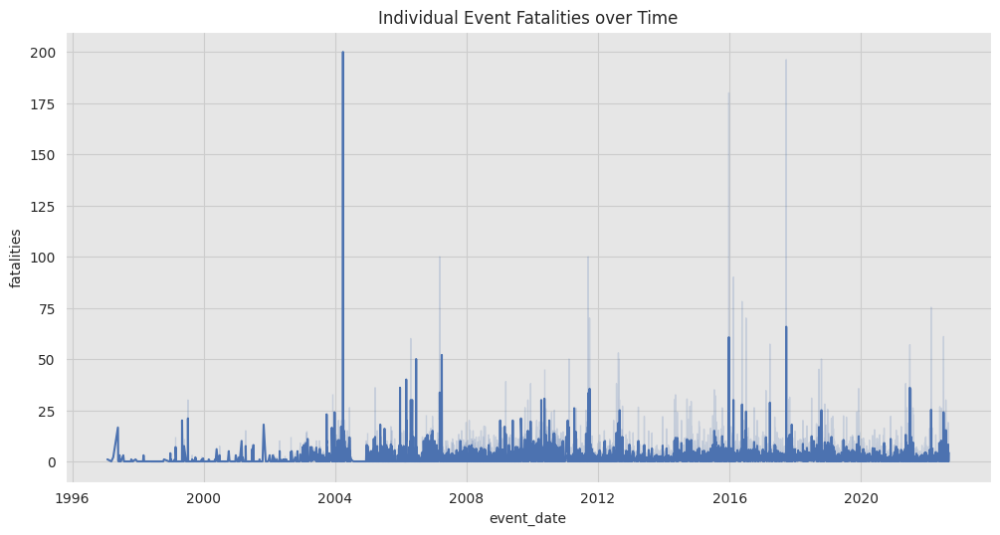

In [ ]:
fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_clean, color=sns_c[0], ax=ax)
ax.set(title='Individual Event Fatalities over Time');

In [ ]:
df = df_clean
df['event_date'] = pd.to_datetime(df['event_date']) - pd.to_timedelta(7, unit='d')
df_weekly = df.groupby([pd.Grouper(key='event_date', freq='W-MON')])['fatalities'].sum().reset_index().sort_values('event_date')
df_monthly = df.groupby(pd.Grouper(key='event_date', freq='M'))['fatalities'].sum().reset_index().sort_values('event_date')

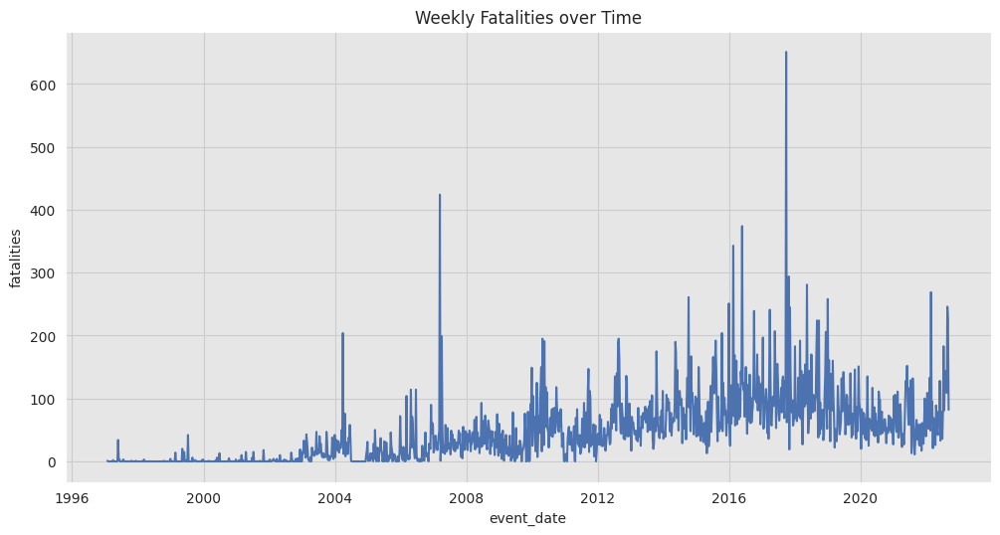

In [ ]:
fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_weekly, color=sns_c[0], ax=ax)
ax.set(title='Weekly Fatalities over Time');

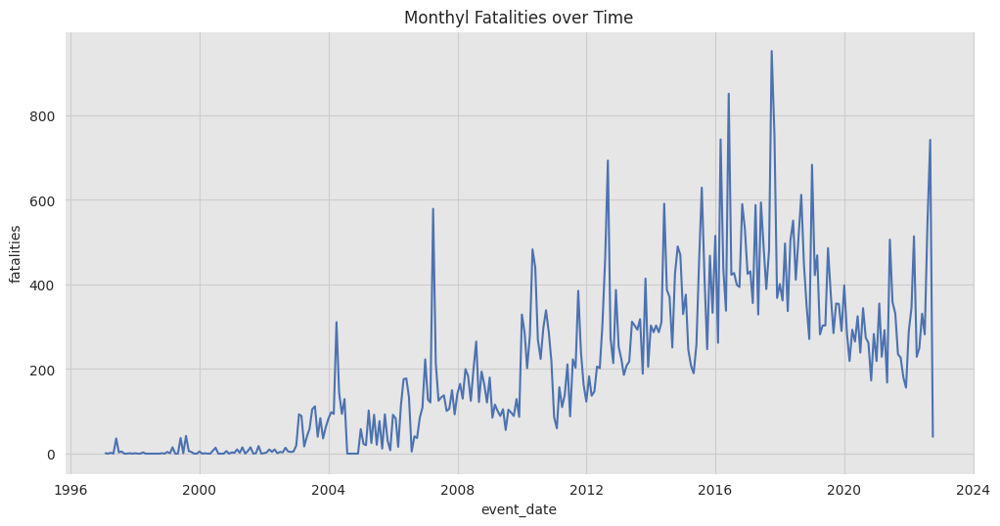

In [ ]:
fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly, color=sns_c[0], ax=ax)
ax.set(title='Monthly Fatalities over Time');

In [ ]:
df_monthly_event_count = df.groupby(pd.Grouper(key='event_date', freq='M')).count().reset_index().sort_values('event_date')

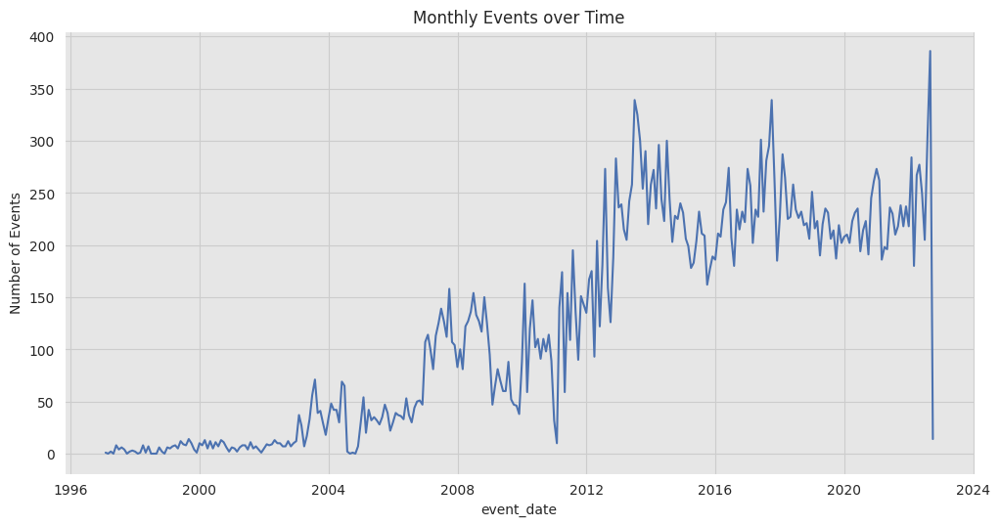

In [ ]:
fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_event_count, color=sns_c[0], ax=ax)
ax.set(title='Monthly Events over Time', ylabel='Number of Events');

In [ ]:
from google.colab import data_table
data_table.enable_dataframe_formatter()
# data_table.disable_dataframe_formatter()

In [ ]:
df_monthly_event_count_by_type = df.groupby(['sub_event_type', pd.Grouper(key='event_date', freq='M')])['fatalities'].count().reset_index().sort_values('event_date')

In [ ]:
df_monthly_event_count_by_type.head(10)

,sub_event_type,event_date,fatalities
719,Attack,1997-01-31,1
720,Attack,1997-03-31,1
352,Armed clash,1997-03-31,1
1275,Government regains territory,1997-05-31,2
721,Attack,1997-05-31,4
353,Armed clash,1997-05-31,2
722,Attack,1997-06-30,2
0,Abduction/forced disappearance,1997-06-30,1
354,Armed clash,1997-06-30,1
723,Attack,1997-07-31,3


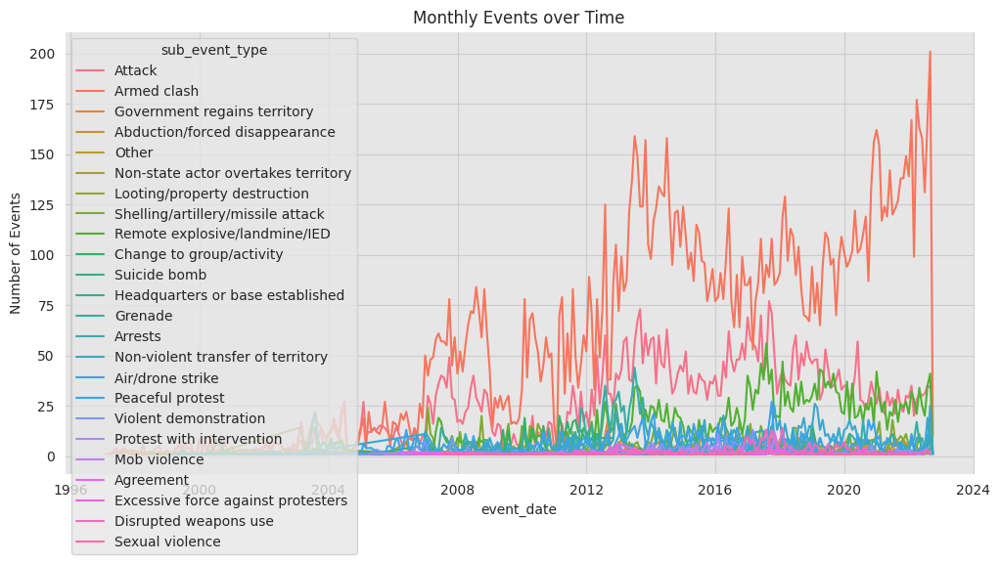

In [ ]:
fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_event_count_by_type, color=sns_c[0], ax=ax, hue='sub_event_type')
ax.set(title='Monthly Events over Time', xlabel='date', ylabel='Number of Events');

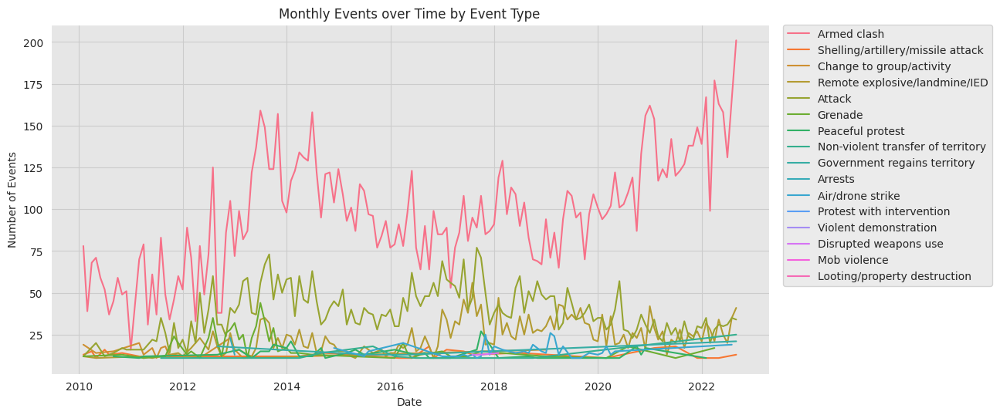

In [ ]:
min_count = 10
min_date = pd.to_datetime("2010-01-01")

# filter to include only data where the count of events is greater than "min_count" and the date is after "min_date"
df_monthly_event_count_by_type_filtered = df_monthly_event_count_by_type[df_monthly_event_count_by_type['fatalities']>min_count]
df_monthly_event_count_by_type_filtered = df_monthly_event_count_by_type_filtered[df_monthly_event_count_by_type_filtered['event_date']>min_date]

fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_event_count_by_type_filtered, color=sns_c[0], ax=ax, hue='sub_event_type')
# place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
# set labels for axis and title
ax.set(title='Monthly Events over Time by Event Type', xlabel='Date', ylabel='Number of Events');

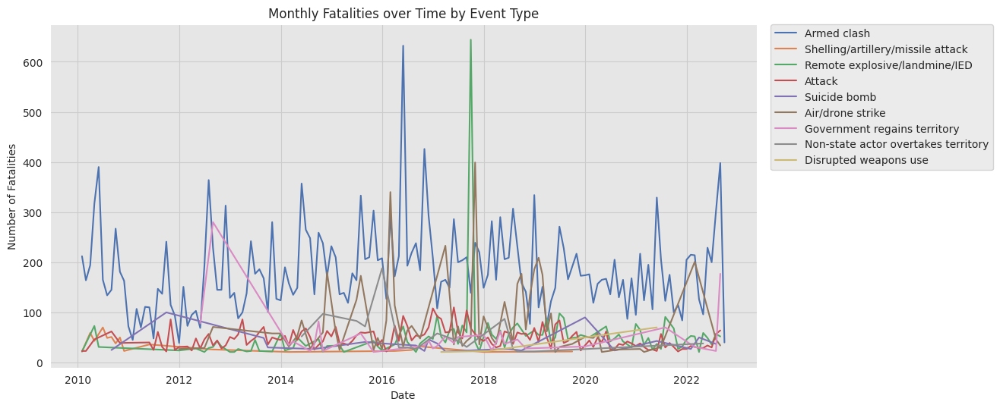

In [ ]:
min_sum = 20
min_date = pd.to_datetime("2010-01-01")

df_monthly_event_sum_by_type = df.groupby(['sub_event_type', pd.Grouper(key='event_date', freq='M')])['fatalities'].sum().reset_index().sort_values('event_date')

# filter to include only data where the count of events is greater than "min_sum" and the date is after "min_date"
df_monthly_event_sum_by_type_filtered = df_monthly_event_sum_by_type[df_monthly_event_sum_by_type['fatalities']>min_sum]
df_monthly_event_sum_by_type_filtered = df_monthly_event_sum_by_type_filtered[df_monthly_event_sum_by_type_filtered['event_date']>min_date]

fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_event_sum_by_type_filtered, color=sns_c[0], ax=ax, hue='sub_event_type')
# place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
# set labels for axis and title
ax.set(title='Monthly Fatalities over Time by Event Type', xlabel='Date', ylabel='Number of Fatalities');

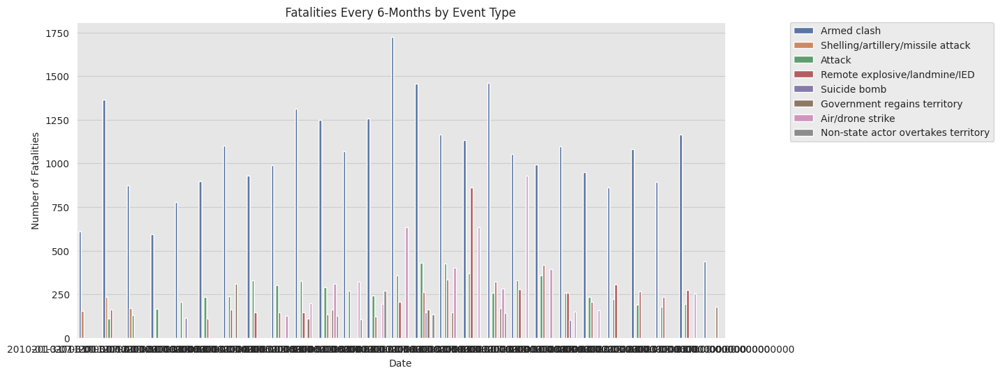

In [ ]:
min_sum = 100
min_date = pd.to_datetime("2010-01-01")

df_monthly_event_sum_by_type = df.groupby(['sub_event_type', pd.Grouper(key='event_date', freq='6M')])['fatalities'].sum().reset_index().sort_values('event_date')

# filter to include only data where the count of events is greater than "min_sum" and the date is after "min_date"
df_monthly_event_sum_by_type_filtered = df_monthly_event_sum_by_type[df_monthly_event_sum_by_type['fatalities']>min_sum]
df_monthly_event_sum_by_type_filtered = df_monthly_event_sum_by_type_filtered[df_monthly_event_sum_by_type_filtered['event_date']>min_date]


fig, ax1 = plt.subplots()
sns.barplot(x='event_date', y='fatalities', data=df_monthly_event_sum_by_type_filtered, ax=ax1, hue='sub_event_type')

# ax2 = ax1.twinx()
# sns.lineplot(x='event_date', y='fatalities', data=df_monthly_event_count_by_type_filtered, color=sns_c[0], ax=ax2, hue='sub_event_type')

# place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.1, 1), loc='upper left', borderaxespad=0)
# set labels for axis and title
ax1.set(title='Fatalities Every 6-Months by Event Type', xlabel='Date', ylabel='Number of Fatalities');

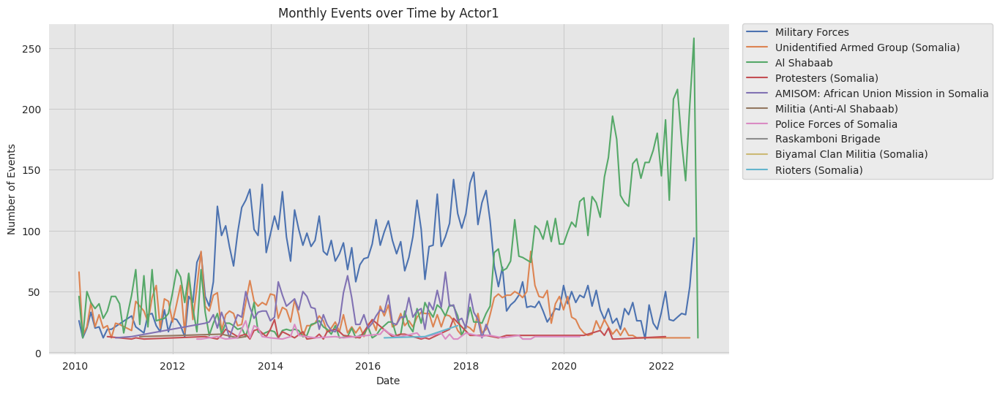

In [ ]:
min_count = 10
min_date = pd.to_datetime("2010-01-01")


# filter to include only data where the count of events is greater than "min_count" and the date is after "min_date"
df_monthly_count_by_actor1 = df.groupby(['actor1', pd.Grouper(key='event_date', freq='M')])['fatalities'].count().reset_index().sort_values('event_date')
df_monthly_count_by_actor1 = df_monthly_count_by_actor1[df_monthly_count_by_actor1['fatalities']>min_count]
df_monthly_count_by_actor1 = df_monthly_count_by_actor1[df_monthly_count_by_actor1['event_date']>min_date]
# df_monthly_count_shabaab = df_monthly_count_shabaab[df_monthly_count_shabaab['actor1'] == "Al Shabaab"]

fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_count_by_actor1, color=sns_c[0], ax=ax, hue='actor1')
# place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
# set labels for axis and title
ax.set(title='Monthly Events over Time by Actor1', xlabel='Date', ylabel='Number of Events');

In [ ]:
df_actors = df
df_actors.loc[df_actors['actor1'].str.contains('Military'), 'actor1'] = 'Military Forces'
df_actors.loc[df_actors['actor1'].str.contains('AMISOM'), 'actor1'] = 'AMISOM: African Union Mission in Somalia'
df_actors.loc[df_actors['actor1'].str.contains('Police'), 'actor1'] = 'Police Forces of Somalia'

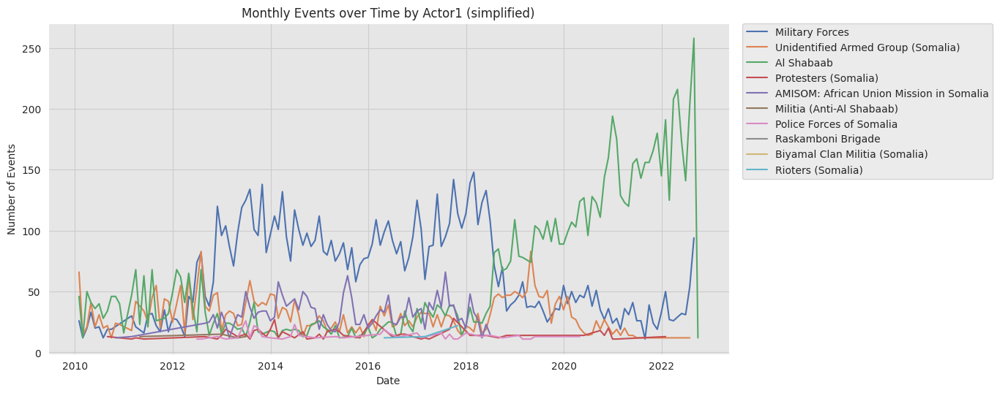

In [ ]:
min_count = 10
min_date = pd.to_datetime("2010-01-01")


# filter to include only data where the count of events is greater than "min_count" and the date is after "min_date"
df_monthly_count_by_actor1_renamed = df_actors.groupby(['actor1', pd.Grouper(key='event_date', freq='M')])['fatalities'].count().reset_index().sort_values('event_date')
df_monthly_count_by_actor1_renamed = df_monthly_count_by_actor1_renamed[df_monthly_count_by_actor1_renamed['fatalities']>min_count]
df_monthly_count_by_actor1_renamed = df_monthly_count_by_actor1_renamed[df_monthly_count_by_actor1_renamed['event_date']>min_date]
# df_monthly_count_shabaab = df_monthly_count_shabaab[df_monthly_count_shabaab['actor1'] == "Al Shabaab"]

fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_count_by_actor1, color=sns_c[0], ax=ax, hue='actor1')
# place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
# set labels for axis and title
ax.set(title='Monthly Events over Time by Actor1 (simplified)', xlabel='Date', ylabel='Number of Events');

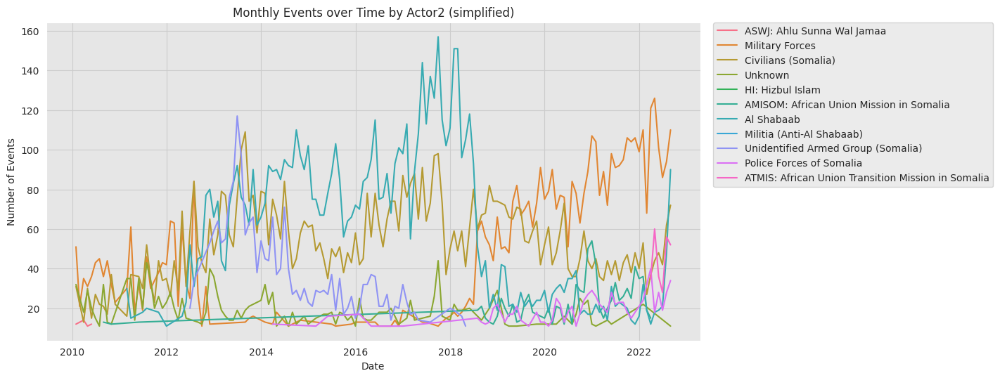

In [ ]:
min_count = 10
min_date = pd.to_datetime("2010-01-01")

# filter to include only data where the count of events is greater than "min_count" and the date is after "min_date"
df_monthly_count_by_actor2 = df_actors.groupby(['actor2', pd.Grouper(key='event_date', freq='M')])['fatalities'].count().reset_index().sort_values('event_date')
df_monthly_count_by_actor2 = df_monthly_count_by_actor2[df_monthly_count_by_actor2['fatalities']>min_count]
df_monthly_count_by_actor2 = df_monthly_count_by_actor2[df_monthly_count_by_actor2['event_date']>min_date]
# df_monthly_count_shabaab = df_monthly_count_shabaab[df_monthly_count_shabaab['actor1'] == "Al Shabaab"]

fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_count_by_actor2, color=sns_c[0], ax=ax, hue='actor2')
# place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
# set labels for axis and title
ax.set(title='Monthly Events over Time by Actor2 (simplified)', xlabel='Date', ylabel='Number of Events');

In [ ]:
df_actors['actor2'] = df_actors['actor2'].replace(np.nan, 'Unknown')
df_actors.loc[df_actors['actor2'].str.contains('Military'), 'actor2'] = 'Military Forces'
df_actors.loc[df_actors['actor2'].str.contains('AMISOM'), 'actor2'] = 'AMISOM: African Union Mission in Somalia'
df_actors.loc[df_actors['actor2'].str.contains('Police'), 'actor2'] = 'Police Forces of Somalia'
df_actors.loc[df_actors['actor2'].str.contains('ATMIS'), 'actor2'] = 'ATMIS: African Union Transition Mission in Somalia'

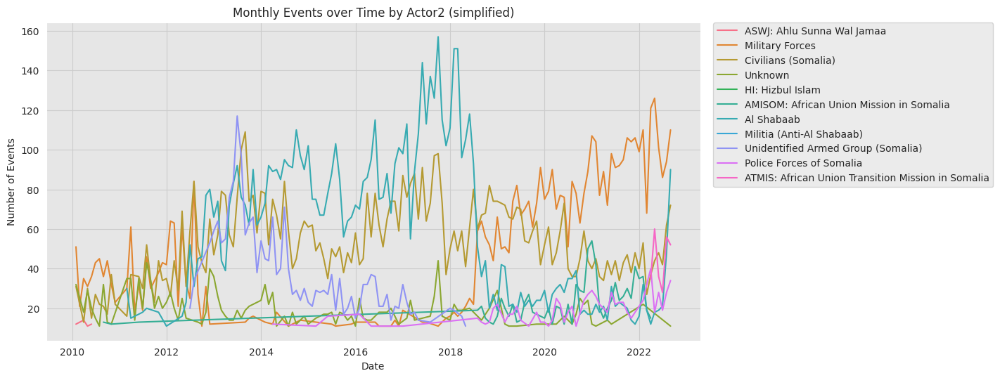

In [ ]:
min_count = 10
min_date = pd.to_datetime("2010-01-01")

# filter to include only data where the count of events is greater than "min_count" and the date is after "min_date"
df_monthly_count_by_actor2_renamed = df_actors.groupby(['actor2', pd.Grouper(key='event_date', freq='M')])['fatalities'].count().reset_index().sort_values('event_date')
df_monthly_count_by_actor2_renamed = df_monthly_count_by_actor2_renamed[df_monthly_count_by_actor2_renamed['fatalities']>min_count]
df_monthly_count_by_actor2_renamed = df_monthly_count_by_actor2_renamed[df_monthly_count_by_actor2_renamed['event_date']>min_date]
# df_monthly_count_shabaab = df_monthly_count_shabaab[df_monthly_count_shabaab['actor1'] == "Al Shabaab"]

fig, ax = plt.subplots()
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_count_by_actor2_renamed, color=sns_c[0], ax=ax, hue='actor2')
# place legend outside top right corner of plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
# set labels for axis and title
ax.set(title='Monthly Events over Time by Actor2 (simplified)', xlabel='Date', ylabel='Number of Events');

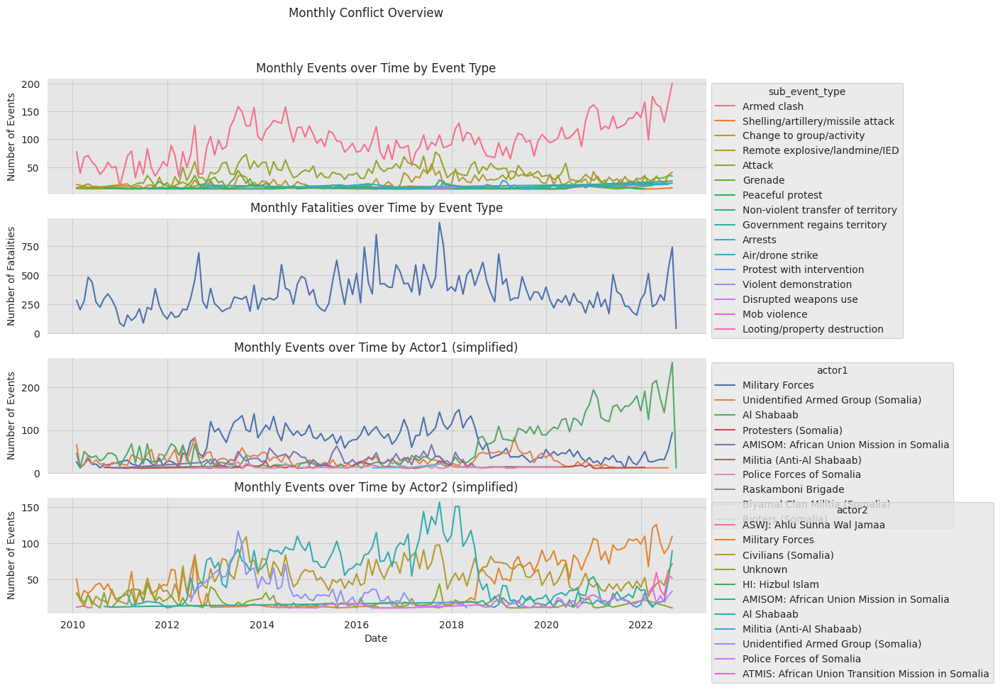

In [ ]:
fig, axes = plt.subplots(4,1, sharex=True, figsize=(12,10))
fig.suptitle('Monthly Conflict Overview')

sns.lineplot(x='event_date', y='fatalities', data=df_monthly_event_count_by_type_filtered, color=sns_c[0], ax=axes[0], hue='sub_event_type')
axes[0].set(title='Monthly Events over Time by Event Type', ylabel='Number of Events');
sns.move_legend(axes[0], "upper left", bbox_to_anchor=(1, 1))

df_monthly_event_sum_by_type = df.groupby([pd.Grouper(key='event_date', freq='M')])['fatalities'].sum().reset_index().sort_values('event_date')
df_monthly_event_sum_by_type_filtered = df_monthly_event_sum_by_type[df_monthly_event_sum_by_type['fatalities']>min_sum]
df_monthly_event_sum_by_type_filtered = df_monthly_event_sum_by_type_filtered[df_monthly_event_sum_by_type_filtered['event_date']>min_date]
sns.lineplot(x='event_date', y='fatalities', data=df_monthly_event_sum_by_type_filtered, color=sns_c[0], ax=axes[1])
axes[1].set(title='Monthly Fatalities over Time by Event Type', ylabel='Number of Fatalities');

sns.lineplot(x='event_date', y='fatalities', data=df_monthly_count_by_actor1_renamed, color=sns_c[0], ax=axes[2], hue='actor1')
axes[2].set(title='Monthly Events over Time by Actor1 (simplified)', xlabel='Date', ylabel='Number of Events');
sns.move_legend(axes[2], "upper left", bbox_to_anchor=(1, 1))

sns.lineplot(x='event_date', y='fatalities', data=df_monthly_count_by_actor2_renamed, color=sns_c[0], ax=axes[3], hue='actor2')
axes[3].set(title='Monthly Events over Time by Actor2 (simplified)', xlabel='Date', ylabel='Number of Events');
sns.move_legend(axes[3], "upper left", bbox_to_anchor=(1, 1))

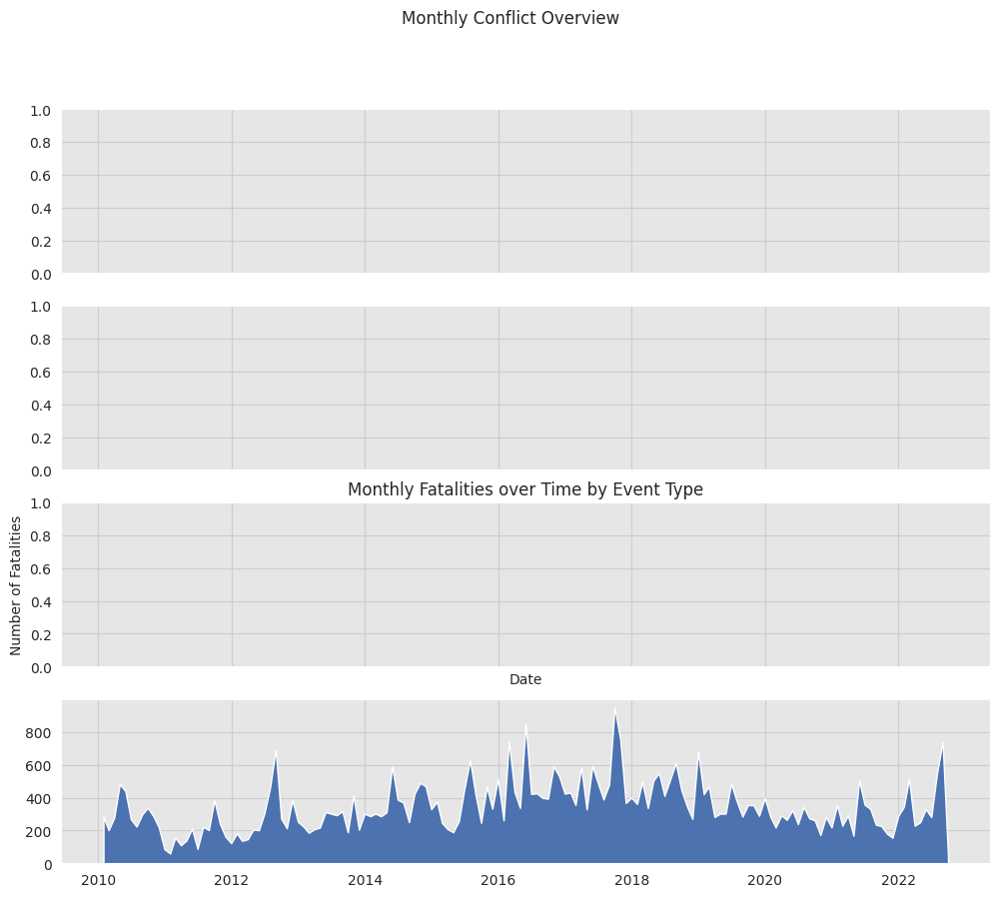

In [ ]:
min_sum = 20
min_date = pd.to_datetime("2010-01-01")

df_monthly_event_sum_by_type = df.groupby([pd.Grouper(key='event_date', freq='M')])['fatalities'].sum().reset_index().sort_values('event_date')

# filter to include only data where the count of events is greater than "min_sum" and the date is after "min_date"
df_monthly_event_sum_by_type_filtered = df_monthly_event_sum_by_type[df_monthly_event_sum_by_type['fatalities']>min_sum]
df_monthly_event_sum_by_type_filtered = df_monthly_event_sum_by_type_filtered[df_monthly_event_sum_by_type_filtered['event_date']>min_date]


fig, axes = plt.subplots(4,1, sharex=True, figsize=(12,10))
fig.suptitle('Monthly Conflict Overview')

plt.stackplot(df_monthly_event_sum_by_type_filtered['event_date'], df_monthly_event_sum_by_type_filtered['fatalities'])
# sns.barplot(x='event_date', y='fatalities', data=df_monthly_event_sum_by_type_filtered, color=sns_c[0], ax=axes[2])
# sns.barplot(x='event_date', y='fatalities', data=df_monthly_event_sum_by_type_filtered, color=sns_c[0], ax=axes[2])
# plt.setp(axes[2].patches, linewidth=0)
axes[2].set(title='Monthly Fatalities over Time by Event Type', xlabel='Date', ylabel='Number of Fatalities');
